# Produce Masks

In [1]:
import os
import pandas
from matplotlib import pyplot
import numpy
from PIL import Image
from torchvision import transforms

%matplotlib inline

c:\Users\User\miniconda3\envs\slasherq\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
root_folder = os.path.dirname(os.path.dirname(os.getcwd()))

file_path = os.path.join(root_folder, 'to_mask', 'output', 'slx256.json')

In [3]:
df = pandas.read_json(file_path)
images = df["image"].apply(lambda x: numpy.array(x)[0, 0, :, :])
masks = df["mask"].apply(lambda x: numpy.array(x)[0, 0, :, :] >= 0.5)

In [4]:
masks[0].shape

(256, 256)

In [5]:
images[0].shape

(256, 256)

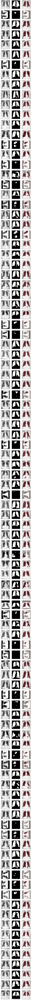

In [6]:
ix_lungs = numpy.arange(0, 100) # numpy.arange(0, images.shape[0])
lung_size = 4
n_lungs = len(ix_lungs)

fig = pyplot.figure(figsize=(3*lung_size, n_lungs*lung_size))
for lung in ix_lungs:
    ax_image = fig.add_subplot(n_lungs,3, 3*lung + 1)
    ax_mask = fig.add_subplot(n_lungs,3, 3*lung + 2)
    ax_combined = fig.add_subplot(n_lungs,3, 3*lung + 3)
    _ = ax_image.imshow(images[lung], cmap="Greys_r")
    _ = ax_mask.imshow(masks[lung], cmap="Greys_r")
    _ = ax_combined.imshow(images[lung], cmap="Greys_r")
    _ = ax_combined.imshow(masks[lung], cmap="Reds", alpha=0.5)